## **ANÁLISIS FINANCIERO DE OPCIONES BANCARIAS**

| Columna                | ¿Qué significa?                                        |
| ---------------------- | ------------------------------------------------------ |
| ticker                 | El código único del contrato de la opción              |
| precio                 | Precio de cierre de la opción ese día                  |
| variacion              | Porcentaje de cambio respecto del día anterior         |
| minimo                 | Precio mínimo del día                                  |
| maximo                 | Precio máximo del día                                  |
| volumen                | Cantidad de dinero operado                             |
| lotes                  | Cantidad de contratos operados                         |
| prima_teorica          | Valor calculado teóricamente (modelo financiero)       |
| volatilidad_implicita  | Volatilidad estimada usando modelos como Black–Scholes |
| probabilidad_ejercicio | Probabilidad de terminar "in the money"                |
| fecha_vto              | Fecha de vencimiento del contrato                      |
| dias_vencimiento       | Días restantes para que expire                         |
| subyacente_ticker      | El activo base (ej. acción)                            |
| subyacente_precio      | Precio de ese activo base                              |
| strike                 | Precio pactado de ejercicio                            |
| otm %                  | Qué tan lejos está del strike (% fuera del dinero)     |
| tipo                   | CALL o PUT                                             |
| mes_abv                | Mes de vencimiento abreviado                           |
| fecha                  | Fecha del registro                                     |


In [2]:
import pandas as pd
import plotly.express as px
df = pd.read_csv("hf://datasets/gauss314/opciones/opciones_arg.csv")

### **LIMPIEZA DE DATOS**

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 432044 entries, 0 to 432043
Data columns (total 21 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Unnamed: 0              432044 non-null  int64  
 1   ticker                  432044 non-null  object 
 2   precio                  432044 non-null  float64
 3   variacion               407888 non-null  float64
 4   minimo                  432044 non-null  float64
 5   maximo                  432044 non-null  float64
 6   lotes                   432044 non-null  float64
 7   volumen                 432044 non-null  float64
 8   prima_teorica           431842 non-null  float64
 9   volatilidad_implicita   374301 non-null  float64
 10  fecha_vto               432044 non-null  object 
 11  dias_vencimiento        432044 non-null  int64  
 12  subyacente_ticker       432044 non-null  object 
 13  subyacente_volatilidad  431842 non-null  float64
 14  subyacente_precio   

In [4]:
df.describe()

,Unnamed: 0,precio,variacion,minimo,maximo,lotes,volumen,prima_teorica,volatilidad_implicita,dias_vencimiento,subyacente_volatilidad,subyacente_precio,strike,otm %,probabilidad_ejercicio
count,432044.000000,432044.000000,407888.000000,432044.000000,432044.000000,432044.000000,4.320440e+05,431842.000000,374301.000000,432044.000000,431842.000000,432044.000000,432044.000000,432044.000000,432044.000000
mean,216021.500000,33.938358,0.028327,32.276499,35.353590,1443.836827,6.502581e+05,43.945238,0.585725,44.620856,0.478582,271.618933,280.228245,0.005382,0.522422
std,124720.504188,273.507682,1.432965,262.658222,279.553842,5134.812346,5.817997e+06,832.495206,0.365903,32.030222,0.235078,1281.120895,1241.450371,0.403836,0.332026
min,0.000000,0.001000,-0.999900,0.001000,0.001000,1.000000,0.000000e+00,0.000000,0.013300,1.000000,0.000000,0.074000,0.050000,-4.997641,0.000000
25%,108010.750000,0.310000,-0.166700,0.290000,0.350000,20.000000,3.425000e+03,0.269000,0.370700,21.000000,0.343000,7.045000,6.740000,-0.107121,0.231400
50%,216021.500000,1.650000,0.000000,1.500000,1.800000,120.000000,1.700000e+04,1.649000,0.498200,39.000000,0.441600,41.400000,40.000000,0.007937,0.507000
75%,324032.250000,8.000000,0.121200,7.500000,8.840000,742.000000,9.215900e+04,8.817000,0.699200,60.000000,0.559300,136.050000,137.160000,0.112903,0.851500
max,432043.000000,16500.000000,432.333300,16047.000000,16500.000000,169231.000000,4.672251e+08,93126.458000,9.999900,371.000000,27.060100,42445.000000,44000.000000,4.998188,1.000000


In [5]:
df.isnull().sum()

Unnamed: 0                    0
ticker                        0
precio                        0
variacion                 24156
minimo                        0
maximo                        0
lotes                         0
volumen                       0
prima_teorica               202
volatilidad_implicita     57743
fecha_vto                     0
dias_vencimiento              0
subyacente_ticker             0
subyacente_volatilidad      202
subyacente_precio             0
tipo                          0
mes_abv                       0
strike                        0
otm %                         0
fecha                         0
probabilidad_ejercicio        0
dtype: int64

In [6]:
df.isna().sum()

Unnamed: 0                    0
ticker                        0
precio                        0
variacion                 24156
minimo                        0
maximo                        0
lotes                         0
volumen                       0
prima_teorica               202
volatilidad_implicita     57743
fecha_vto                     0
dias_vencimiento              0
subyacente_ticker             0
subyacente_volatilidad      202
subyacente_precio             0
tipo                          0
mes_abv                       0
strike                        0
otm %                         0
fecha                         0
probabilidad_ejercicio        0
dtype: int64

In [7]:
df.dtypes

Unnamed: 0                  int64
ticker                     object
precio                    float64
variacion                 float64
minimo                    float64
maximo                    float64
lotes                     float64
volumen                   float64
prima_teorica             float64
volatilidad_implicita     float64
fecha_vto                  object
dias_vencimiento            int64
subyacente_ticker          object
subyacente_volatilidad    float64
subyacente_precio         float64
tipo                       object
mes_abv                    object
strike                    float64
otm %                     float64
fecha                      object
probabilidad_ejercicio    float64
dtype: object

In [8]:
df["fecha_vto"] = pd.to_datetime(df["fecha_vto"], format="%Y-%m-%d")
df["fecha"] = pd.to_datetime(df["fecha"], format="%Y-%m-%d")
df.dtypes

Unnamed: 0                         int64
ticker                            object
precio                           float64
variacion                        float64
minimo                           float64
maximo                           float64
lotes                            float64
volumen                          float64
prima_teorica                    float64
volatilidad_implicita            float64
fecha_vto                 datetime64[ns]
dias_vencimiento                   int64
subyacente_ticker                 object
subyacente_volatilidad           float64
subyacente_precio                float64
tipo                              object
mes_abv                           object
strike                           float64
otm %                            float64
fecha                     datetime64[ns]
probabilidad_ejercicio           float64
dtype: object

In [9]:
df.drop(columns=["Unnamed: 0"])

,ticker,precio,variacion,minimo,maximo,lotes,volumen,prima_teorica,volatilidad_implicita,fecha_vto,dias_vencimiento,subyacente_ticker,subyacente_volatilidad,subyacente_precio,tipo,mes_abv,strike,otm %,fecha,probabilidad_ejercicio
0,GFGV2.05EN,0.020,-0.6667,0.020,0.02,1000.0,2000.0,0.008,0.4565,2010-01-15,11,GGAL,0.3332,2.18,PUT,EN,2.050,0.059633,2010-01-04,0.1600
1,TS.V72.0EN,0.200,0.0000,0.200,0.20,100.0,2000.0,0.010,0.5596,2010-01-15,11,TS,0.3489,83.50,PUT,EN,72.000,0.137725,2010-01-04,0.0167
2,TS.V77506E,0.350,-0.7083,0.350,0.35,10.0,350.0,0.238,0.3899,2010-01-15,11,TS,0.3489,83.50,PUT,E,77.506,0.071784,2010-01-04,0.0907
3,PBRV86.4FE,1.500,NaN,1.500,1.50,10.0,1500.0,1.006,0.3186,2010-02-19,46,APBR,0.2672,92.20,PUT,FE,86.400,0.062907,2010-01-04,0.2156
4,BPAV3.80FE,0.105,-0.3000,0.102,0.11,330.0,3516.0,0.227,0.3078,2010-02-19,46,BPAT,0.5392,3.90,PUT,FE,3.800,0.025641,2010-01-04,0.4022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432039,COMC108.JU,18.000,0.1250,18.000,18.00,58.0,104400.0,24.359,0.3611,2024-06-21,161,COME,0.7240,87.40,CALL,JU,108.000,0.235698,2024-01-12,0.3812
432040,CREC1200JU,400.000,-0.1111,400.000,430.00,51.0,2177000.0,432.799,1.0618,2024-06-21,161,CRES,1.2164,1047.80,CALL,JU,1200.000,0.145257,2024-01-12,0.4692
432041,GFGC1200JU,1100.000,0.0000,1100.000,1100.00,4.0,440000.0,1074.490,1.0400,2024-06-21,161,GGAL,0.8335,1851.25,CALL,JU,1200.000,-0.351789,2024-01-12,0.9554
432042,GFGC3000JU,150.000,-0.2500,150.000,150.00,1.0,15000.0,356.263,0.4146,2024-06-21,161,GGAL,0.8335,1851.25,CALL,JU,3000.000,0.620527,2024-01-12,0.1299


In [10]:
df.shape

(432044, 21)

In [11]:
df.drop_duplicates()
df.shape

(432044, 21)

In [12]:
#hacer imputacion de nulos para las columnas q tienen null menos de la de variacion
df['prima_teorica'] = (
    df.groupby('tipo')['prima_teorica']
      .transform(lambda x: x.fillna(x.median()))
)
df.isnull().sum()

Unnamed: 0                    0
ticker                        0
precio                        0
variacion                 24156
minimo                        0
maximo                        0
lotes                         0
volumen                       0
prima_teorica                 0
volatilidad_implicita     57743
fecha_vto                     0
dias_vencimiento              0
subyacente_ticker             0
subyacente_volatilidad      202
subyacente_precio             0
tipo                          0
mes_abv                       0
strike                        0
otm %                         0
fecha                         0
probabilidad_ejercicio        0
dtype: int64

In [13]:
df['volatilidad_implicita'] = df.groupby(['tipo', 'subyacente_ticker'])['volatilidad_implicita'].transform(
    lambda x: x.fillna(x.median())
)
df['subyacente_volatilidad'] = df.groupby('subyacente_ticker')['subyacente_volatilidad'].transform(
    lambda x: x.fillna(x.median())
)
df.isnull().sum()

c:\Users\males\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


Unnamed: 0                    0
ticker                        0
precio                        0
variacion                 24156
minimo                        0
maximo                        0
lotes                         0
volumen                       0
prima_teorica                 0
volatilidad_implicita         1
fecha_vto                     0
dias_vencimiento              0
subyacente_ticker             0
subyacente_volatilidad        0
subyacente_precio             0
tipo                          0
mes_abv                       0
strike                        0
otm %                         0
fecha                         0
probabilidad_ejercicio        0
dtype: int64

In [14]:
df.drop(columns=["variacion"])

,Unnamed: 0,ticker,precio,minimo,maximo,lotes,volumen,prima_teorica,volatilidad_implicita,fecha_vto,dias_vencimiento,subyacente_ticker,subyacente_volatilidad,subyacente_precio,tipo,mes_abv,strike,otm %,fecha,probabilidad_ejercicio
0,0,GFGV2.05EN,0.020,0.020,0.02,1000.0,2000.0,0.008,0.4565,2010-01-15,11,GGAL,0.3332,2.18,PUT,EN,2.050,0.059633,2010-01-04,0.1600
1,1,TS.V72.0EN,0.200,0.200,0.20,100.0,2000.0,0.010,0.5596,2010-01-15,11,TS,0.3489,83.50,PUT,EN,72.000,0.137725,2010-01-04,0.0167
2,2,TS.V77506E,0.350,0.350,0.35,10.0,350.0,0.238,0.3899,2010-01-15,11,TS,0.3489,83.50,PUT,E,77.506,0.071784,2010-01-04,0.0907
3,3,PBRV86.4FE,1.500,1.500,1.50,10.0,1500.0,1.006,0.3186,2010-02-19,46,APBR,0.2672,92.20,PUT,FE,86.400,0.062907,2010-01-04,0.2156
4,4,BPAV3.80FE,0.105,0.102,0.11,330.0,3516.0,0.227,0.3078,2010-02-19,46,BPAT,0.5392,3.90,PUT,FE,3.800,0.025641,2010-01-04,0.4022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432039,432039,COMC108.JU,18.000,18.000,18.00,58.0,104400.0,24.359,0.3611,2024-06-21,161,COME,0.7240,87.40,CALL,JU,108.000,0.235698,2024-01-12,0.3812
432040,432040,CREC1200JU,400.000,400.000,430.00,51.0,2177000.0,432.799,1.0618,2024-06-21,161,CRES,1.2164,1047.80,CALL,JU,1200.000,0.145257,2024-01-12,0.4692
432041,432041,GFGC1200JU,1100.000,1100.000,1100.00,4.0,440000.0,1074.490,1.0400,2024-06-21,161,GGAL,0.8335,1851.25,CALL,JU,1200.000,-0.351789,2024-01-12,0.9554
432042,432042,GFGC3000JU,150.000,150.000,150.00,1.0,15000.0,356.263,0.4146,2024-06-21,161,GGAL,0.8335,1851.25,CALL,JU,3000.000,0.620527,2024-01-12,0.1299


###  **EDA** 
Para tener un análisis más enfocado, se crearon dos subsets, uno para manejar preguntas a resolver más comerciales (entender actividad, demanda y comportamiento del mercado), y otro para resolver preguntas más enfocadas a un análisis financiero profundo. 

In [15]:
df_clean = df.copy()
# aquí ya quitaste columnas que no usas, imputaste lo necesario, convertiste fechas, etc.
cols_comercial = ['ticker','fecha','volumen','lotes','precio','tipo','subyacente_ticker', 'dias_vencimiento']
cols_financiero = ['precio','prima_teorica','volatilidad_implicita',
                   'dias_vencimiento','strike','probabilidad_ejercicio','otm %']

df_comercial = df_clean[cols_comercial]
df_financiero = df_clean[cols_financiero]
df_comercial.head()

,ticker,fecha,volumen,lotes,precio,tipo,subyacente_ticker,dias_vencimiento
0,GFGV2.05EN,2010-01-04,2000.0,1000.0,0.020,PUT,GGAL,11
1,TS.V72.0EN,2010-01-04,2000.0,100.0,0.200,PUT,TS,11
2,TS.V77506E,2010-01-04,350.0,10.0,0.350,PUT,TS,11
3,PBRV86.4FE,2010-01-04,1500.0,10.0,1.500,PUT,APBR,46
4,BPAV3.80FE,2010-01-04,3516.0,330.0,0.105,PUT,BPAT,46


In [16]:
df_financiero.head()

,precio,prima_teorica,volatilidad_implicita,dias_vencimiento,strike,probabilidad_ejercicio,otm %
0,0.020,0.008,0.4565,11,2.050,0.1600,0.059633
1,0.200,0.010,0.5596,11,72.000,0.0167,0.137725
2,0.350,0.238,0.3899,11,77.506,0.0907,0.071784
3,1.500,1.006,0.3186,46,86.400,0.2156,0.062907
4,0.105,0.227,0.3078,46,3.800,0.4022,0.025641


#### **ANALISIS COMERCIAL** 

¿Cuáles son los subyacentes con mayor volumen total operado?

In [17]:
subyacentes_vol = (df_comercial.groupby("subyacente_ticker")["volumen"].sum().sort_values(ascending=False))
print(subyacentes_vol.head(10))

subyacente_ticker
GGAL    2.369256e+11
YPFD    1.132543e+10
ALUA    1.046873e+10
APBR    7.091546e+09
COME    4.875279e+09
PAMP    1.631984e+09
TXAR    1.138288e+09
AL30    9.151140e+08
TVPP    7.736683e+08
TS      6.969106e+08
Name: volumen, dtype: float64


¿Cuáles son los 10 contratos con mayor volumen?

In [18]:
contratos_vol = (df_comercial.groupby("ticker")["volumen"].sum().sort_values(ascending=False))
print(contratos_vol.head(10))

ticker
GFGC1640DI    4.001351e+09
GFGC500.FE    3.579582e+09
GFGC14915D    3.561164e+09
GFGC97304G    3.532162e+09
GFGC13915D    3.125413e+09
GFGC98152G    2.954438e+09
GFGC12915D    2.941133e+09
GFGC2100FE    2.887461e+09
GFGC57627J    2.371193e+09
GFGC500.AB    2.075530e+09
Name: volumen, dtype: float64


¿Qué tipo tiene más volumen operado? ¿Qué tipo tiene más cantidad de contratos (lotes)?

In [19]:

analisis_tipo = df_comercial.groupby("tipo").agg({
    "volumen": "sum",  
    "lotes": "sum"    
})
analisis_tipo = analisis_tipo.sort_values(by="volumen", ascending=False)
print(analisis_tipo)

           volumen        lotes
tipo                           
CALL  2.594602e+11  562374757.0
PUT   2.147992e+10   61426281.0


¿Cómo evoluciona el volumen total a lo largo del tiempo?

In [20]:
df_comercial['año'] = df_comercial['fecha'].dt.year
volumen_anual = df_comercial.groupby('año')['volumen'].mean()
print(volumen_anual)

año
2010    4.311425e+04
2011    3.557146e+04
2012    3.936862e+04
2013    6.155194e+04
2014    7.394458e+04
2015    1.093654e+05
2016    1.256039e+05
2017    1.233187e+05
2018    2.434002e+05
2019    4.231643e+05
2020    5.884847e+05
2021    7.858030e+05
2022    1.138323e+06
2023    4.106523e+06
2024    5.331770e+06
Name: volumen, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\3963109977.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comercial['año'] = df_comercial['fecha'].dt.year


In [21]:
fig = px.line(volumen_anual, x=volumen_anual.index, y='volumen', title='Volumen Promedio Anual de Operaciones')
fig.show()

¿Existe un patrón mensual o semanal en la cantidad de operaciones?

In [22]:
df_comercial['dia_semana'] = df_comercial['fecha'].dt.day_name()

volumen_semanal = (
    df_comercial
    .groupby('dia_semana')['volumen']
    .mean()
    .reindex(['Monday','Tuesday','Wednesday','Thursday','Friday'])
)

print(volumen_semanal)

dia_semana
Monday       616186.720771
Tuesday      650381.720818
Wednesday    688357.844528
Thursday     652217.947427
Friday       637510.480684
Name: volumen, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\195083172.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: xlabel='dia_semana'>

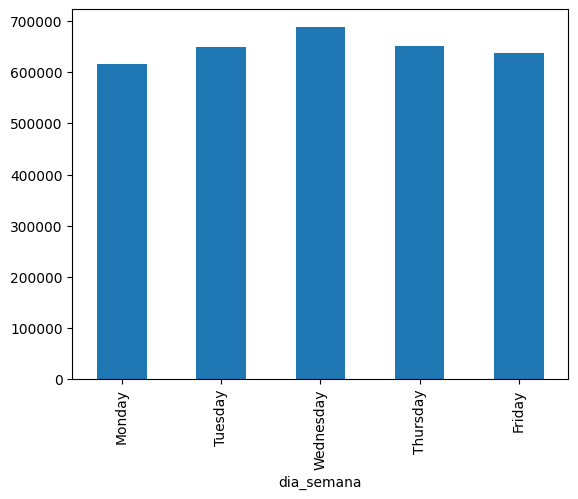

In [23]:
volumen_semanal.plot(kind='bar')

In [24]:
df_comercial['dia_mes'] = df_comercial['fecha'].dt.day
volumen_mensual = df_comercial.groupby('dia_mes')['volumen'].mean()
print("\nPromedio de volumen por día del mes:")
print(volumen_mensual)


Promedio de volumen por día del mes:
dia_mes
1     622542.499333
2     499144.680271
3     560084.780568
4     583142.505004
5     652474.125305
6     679766.775581
7     650072.851716
8     709340.097661
9     601546.648187
10    580929.995369
11    713637.875313
12    719228.093922
13    741738.646938
14    654266.023173
15    562429.766162
16    632876.103324
17    627964.801404
18    581855.149416
19    495729.044867
20    599287.155421
21    782535.365895
22    682270.933117
23    669048.815039
24    814789.696432
25    675527.393929
26    653755.983603
27    819274.808541
28    726156.673939
29    640765.904694
30    599331.487348
31    688568.325713
Name: volumen, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\1153394032.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: xlabel='dia_mes'>

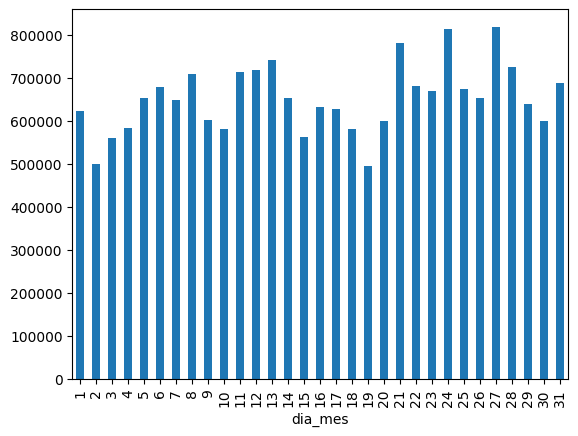

In [25]:
volumen_mensual.plot(kind='bar')

¿Se incrementa el volumen cuando faltan pocos días para vencer?



In [26]:

df_comercial = df_comercial.copy()

df_comercial['rango_dias'] = pd.cut(
    df_comercial['dias_vencimiento'],
    bins=[0, 5, 10, 20, 40, 80, 200, 500],
    labels=['0–5 días', '6–10 días', '11–20 días', '21–40 días', '41–80 días', '81–200 días', '201–500 días'],
    right=False  
)

vol_por_rango = df_comercial.groupby('rango_dias')['volumen'].mean()

print("Volumen promedio por rango de días restantes:")
print(vol_por_rango)

Volumen promedio por rango de días restantes:
rango_dias
0–5 días        9.283952e+05
6–10 días       7.782331e+05
11–20 días      7.695285e+05
21–40 días      7.634379e+05
41–80 días      6.448028e+05
81–200 días     1.127719e+05
201–500 días    2.463333e+06
Name: volumen, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\669920349.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: xlabel='rango_dias'>

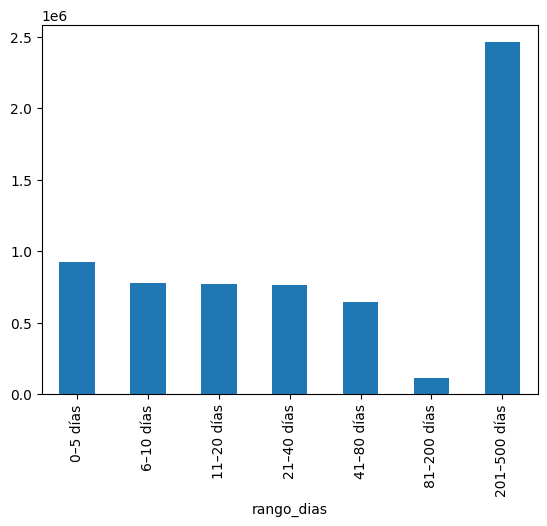

In [27]:
vol_por_rango.plot(kind='bar')


¿Las opciones más baratas son las más operadas?


In [ ]:

print(df_comercial['precio'].describe())

print("Valores únicos de 'precio':", df_comercial['precio'].unique()[:10])

count    432044.000000
mean         33.938358
std         273.507682
min           0.001000
25%           0.310000
50%           1.650000
75%           8.000000
max       16500.000000
Name: precio, dtype: float64
Valores únicos de 'precio': [0.02  0.2   0.35  1.5   0.105 0.1   0.021 0.041 0.074 0.068]


In [ ]:

percentile_1 = df_comercial['precio'].quantile(0.01)
percentile_99 = df_comercial['precio'].quantile(0.99)

df_comercial_filtrado = df_comercial[(df_comercial['precio'] >= percentile_1) & (df_comercial['precio'] <= percentile_99)]

print("Nuevo resumen estadístico después de aplicar percentiles:")
print(df_comercial_filtrado['precio'].describe())

Nuevo resumen estadístico después de aplicar percentiles:
count    423687.000000
mean         15.822268
std          53.173778
min           0.005000
25%           0.325000
50%           1.650000
75%           7.900000
max         600.000000
Name: precio, dtype: float64


In [ ]:

bins_precio = [0, 10, 50, 100, 500, float('inf')]
labels_precio = ['Muy barato (0-10)', 'Barato (10-50)', 'Medio (50-100)', 'Caro (100-500)', 'Muy caro (500-1000)']
df_comercial_filtrado['rango_precio'] = pd.cut(df_comercial_filtrado['precio'], bins=bins_precio, labels=labels_precio)

volumen_por_precio = df_comercial_filtrado.groupby('rango_precio')['volumen'].mean()

print("Volumen promedio por rango de precios (sin outliers):")
print(volumen_por_precio)



Volumen promedio por rango de precios (sin outliers):
rango_precio
Muy barato (0-10)      2.272618e+05
Barato (10-50)         1.410210e+06
Medio (50-100)         3.090239e+06
Caro (100-500)         4.516946e+06
Muy caro (500-1000)    2.968343e+06
Name: volumen, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\3912267961.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\males\AppData\Local\Temp\ipykernel_9628\3912267961.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: title={'center': 'Relación Precio-Volumen'}, xlabel='Rango de Precio', ylabel='Volumen Promedio'>

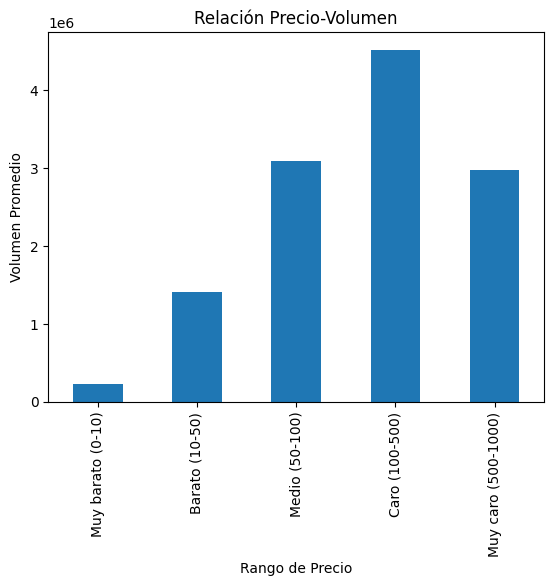

In [ ]:

volumen_por_precio.plot(kind='bar', title='Relación Precio-Volumen', ylabel='Volumen Promedio', xlabel='Rango de Precio')



¿Cómo se distribuyen los precios?

In [ ]:
import plotly.express as px
fig = px.box(df_comercial_filtrado, x='precio', title='Distribución de Precios de Opciones')
fig.update_traces(boxmean=True) 
fig.show()

#### **CONCLUSIONES ANÁLISIS COMERCIAL**

#####  ANÁLISIS 1

¿Cuáles son los subyacentes con mayor volumen total operado?

> El volumen de negociación en el mercado de opciones argentino se concentra fuertemente en un número reducido de subyacentes, destacándose GGAL como el activo más operado por amplio margen. Esto sugiere que la liquidez del mercado depende principalmente de acciones bancarias y energéticas, con participación secundaria de bonos soberanos como instrumentos de cobertura.



##### ANÁLISIS 2

¿Cuáles son los 10 contratos (tickers) con mayor volumen?

> La negociación de opciones no solo se concentra en determinados subyacentes, sino también en contratos específicos. Esto indica que los operadores prefieren series puntuales que ofrecen mejores condiciones de liquidez y atractivo operativo, en lugar de distribuir su actividad de forma uniforme entre todos los contratos disponibles.



##### ANÁLISIS 3

¿Qué tipo tiene más volumen operado y más contratos (CALL vs PUT)?

> El mercado de opciones presenta una clara predominancia de contratos CALL tanto en volumen monetario como en cantidad de contratos negociados. Este comportamiento sugiere un sesgo alcista general del mercado y una mayor preferencia por estrategias que apuestan a incrementos en el precio de los subyacentes.



##### ANÁLISIS 4

¿Cómo evoluciona el volumen total a lo largo del tiempo?

> Se observa un crecimiento sostenido y significativo del volumen de negociación de opciones a lo largo del tiempo, con una aceleración notable en los años más recientes. Esto sugiere una mayor utilización de derivados financieros en respuesta a un entorno macroeconómico más volátil y a una mayor sofisticación de los participantes del mercado.



##### ANÁLISIS 5

¿Existe un patrón semanal o mensual en la cantidad de operaciones?

> El análisis revela patrones temporales claros en la negociación de opciones. A nivel semanal, la actividad se intensifica a mitad de semana, mientras que a nivel mensual se observan picos en determinados días, probablemente asociados a vencimientos y ajustes de portafolio. Esto indica que la operativa no es uniforme en el tiempo, sino que responde a dinámicas calendarias.



##### ANÁLISIS 6

¿Se incrementa el volumen cuando faltan pocos días para vencer?

> El volumen de negociación muestra un incremento cuando las opciones se encuentran muy próximas al vencimiento (0–5 días), lo cual es consistente con el cierre y ajuste de posiciones.Sin embargo, también se observa un volumen excepcionalmente alto en opciones con vencimientos muy lejanos (201–500 días), lo que sugiere una fuerte preferencia del mercado por contratos de largo plazo, posiblemente utilizados como instrumentos de cobertura o estrategias extendidas.



##### ANÁLISIS 7

¿Las opciones más baratas son las más operadas?

> La relación precio–volumen no es lineal. Las opciones de precio intermedio concentran el mayor volumen de negociación, lo que sugiere que los operadores buscan un balance entre costo, liquidez y potencial de ganancia. Las opciones extremadamente baratas o muy caras presentan menor actividad relativa.



##### ANÁLISIS 8 

¿Cómo se distribuyen los precios?

> La distribución de precios de las opciones es fuertemente asimétrica, con una gran cantidad de contratos de bajo precio y pocos valores extremos. Esto confirma que, aunque existen muchas opciones baratas, el mercado concentra su actividad en un rango específico de precios.

#### **ANÁLISIS FINANCIERO**

¿Las opciones se negocian por encima o por debajo de su valor teórico?

rango_prima
(0.0, 10.0]         0.118883
(10.0, 50.0]       -1.430846
(50.0, 100.0]      -4.332765
(100.0, 500.0]     -9.821689
(500.0, inf]     -727.705268
Name: diff, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\12795548.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: title={'center': 'Diferencia Precio Real vs Valor Teórico'}, xlabel='Rango de Prima Teórica', ylabel='Diferencia Promedio'>

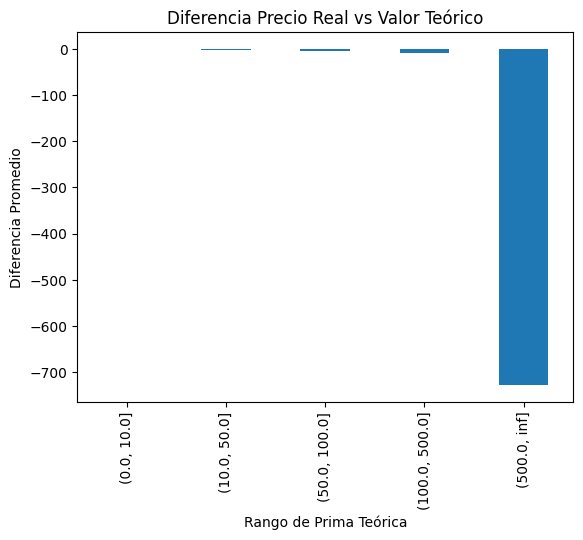

In [33]:
df_fin = df_financiero.copy()

df_fin['diff'] = df_fin['precio'] - df_fin['prima_teorica']
df_fin['rango_prima'] = pd.cut(
    df_fin['prima_teorica'],
    [0, 10, 50, 100, 500, float('inf')]
)

resultado = df_fin.groupby('rango_prima')['diff'].mean()

print(resultado)
resultado.plot(kind='bar', title='Diferencia Precio Real vs Valor Teórico', ylabel='Diferencia Promedio', xlabel='Rango de Prima Teórica')

¿Qué tan riesgoso es el mercado de opciones?

In [ ]:

print(df_financiero['volatilidad_implicita'].describe())

print("Valores únicos de 'volatilidad':", df_financiero['volatilidad_implicita'].unique()[:10])

count    432043.000000
mean          0.574714
std           0.342809
min           0.013300
25%           0.385600
50%           0.499600
75%           0.662600
max           9.999900
Name: volatilidad_implicita, dtype: float64
Valores únicos de 'volatilidad': [0.4565 0.5596 0.3899 0.3186 0.3078 0.3088 0.3453 0.3333 0.3243 0.3516]


In [ ]:
import plotly.express as px
fig = px.box(df_financiero, x='volatilidad_implicita', title='Distribución de Volatilidad Implícita')
fig.update_traces(boxmean=True)  
fig.show()

¿Cómo cambia el riesgo conforme se acerca el vencimiento?

In [42]:
df_financiero = df_financiero.copy()

df_financiero['rango_dias'] = pd.cut(
    df_financiero['dias_vencimiento'],
    bins=[0, 5, 10, 20, 40, 80, 200, 500],
    labels=['0–5 días', '6–10 días', '11–20 días', '21–40 días', '41–80 días', '81–200 días', '201–500 días'],
    right=False  
)

vol_por_rango = df_financiero.groupby('rango_dias')['volatilidad_implicita'].mean()

print("Volatilidad promedio por rango de días restantes:")
print(vol_por_rango)

Volatilidad promedio por rango de días restantes:
rango_dias
0–5 días        0.792236
6–10 días       0.640795
11–20 días      0.609381
21–40 días      0.561586
41–80 días      0.527299
81–200 días     0.571170
201–500 días    0.491900
Name: volatilidad_implicita, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\2050717620.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: xlabel='rango_dias'>

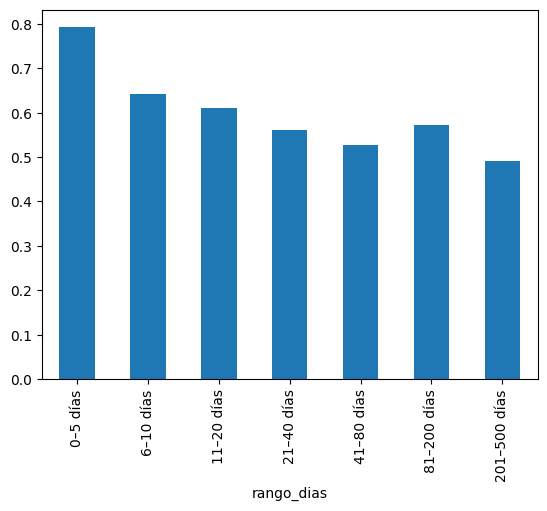

In [43]:
vol_por_rango.plot(kind='bar')

¿Qué tan probable es que las opciones terminen “ganando”?

In [44]:

print(df_financiero['probabilidad_ejercicio'].describe())

print("Valores únicos de probabilidad_ejercicio:", df_financiero['probabilidad_ejercicio'].unique()[:10])

count    432044.000000
mean          0.522422
std           0.332026
min           0.000000
25%           0.231400
50%           0.507000
75%           0.851500
max           1.000000
Name: probabilidad_ejercicio, dtype: float64
Valores únicos de probabilidad_ejercicio: [0.16   0.0167 0.0907 0.2156 0.4022 0.1055 0.1588 0.2819 0.3989 0.1176]


In [45]:
import plotly.express as px
fig = px.box(df_financiero, x='probabilidad_ejercicio', title='Distribución de probabilidad de ejercicio')
fig.update_traces(boxmean=True)  
fig.show()

¿Cómo cambia la probabilidad de ejercicio según qué tan lejos está la opción del dinero?

In [49]:
pearson = df_fin[['otm %', 'probabilidad_ejercicio']].corr().iloc[0,1]

print("Correlación Pearson (lineal):", pearson)


Correlación Pearson (lineal): -0.5612735463979864


In [59]:

df_financiero['rango_otm'] = pd.cut(
    df_financiero['otm %'],
    bins=[0, 0.05, 0.15, 0.30, 0.50, float('inf')],
    labels=[
    '0–5% (cerca/ATM)',
    '5–15% (OTM bajo)',
    '15–30% (OTM medio)',
    '30–50% (OTM alto)',
    '>50% (OTM extremo)'
],
    right=False
)

res_otm = df_financiero.groupby('rango_otm')['probabilidad_ejercicio'].mean()

print(res_otm)



rango_otm
0–5% (cerca/ATM)      0.434499
5–15% (OTM bajo)      0.265807
15–30% (OTM medio)    0.130435
30–50% (OTM alto)     0.055640
>50% (OTM extremo)    0.016679
Name: probabilidad_ejercicio, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\4203625080.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: title={'center': 'Probabilidad de ejercicio vs Rango OTM%'}, xlabel='rango_otm', ylabel='Probabilidad promedio'>

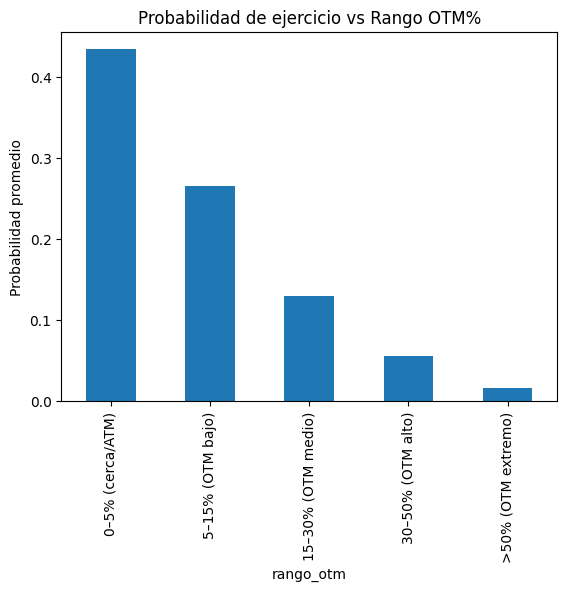

In [61]:
res_otm.plot(kind='bar', title='Probabilidad de ejercicio vs Rango OTM%', ylabel='Probabilidad promedio')


¿Las opciones más caras tienen mayor probabilidad de ejercicio?

In [ ]:

print(df_financiero['precio'].describe())

print("Valores únicos de 'precio':", df_financiero['precio'].unique()[:10]) 



count    432044.000000
mean         33.938358
std         273.507682
min           0.001000
25%           0.310000
50%           1.650000
75%           8.000000
max       16500.000000
Name: precio, dtype: float64
Valores únicos de 'precio': [0.02  0.2   0.35  1.5   0.105 0.1   0.021 0.041 0.074 0.068]


In [ ]:

percentile_1 = df_financiero['precio'].quantile(0.01)
percentile_99 = df_financiero['precio'].quantile(0.99)
df_financiero_filtrado = df_financiero[(df_financiero['precio'] >= percentile_1) & (df_financiero['precio'] <= percentile_99)]

print("Nuevo resumen estadístico después de aplicar percentiles:")
print(df_financiero_filtrado['precio'].describe())


Nuevo resumen estadístico después de aplicar percentiles:
count    423687.000000
mean         15.822268
std          53.173778
min           0.005000
25%           0.325000
50%           1.650000
75%           7.900000
max         600.000000
Name: precio, dtype: float64


In [ ]:

bins_precio = [0, 10, 50, 100, 500, float('inf')]
labels_precio = ['Muy barato (0-10)', 'Barato (10-50)', 'Medio (50-100)', 'Caro (100-500)', 'Muy caro (500-1000)']
df_financiero_filtrado['rango_precio'] = pd.cut(df_financiero_filtrado['precio'], bins=bins_precio, labels=labels_precio)

prob_por_precio = df_financiero_filtrado.groupby('rango_precio')['probabilidad_ejercicio'].mean()

print("Probabilidad promedio por rango de precios:")
print(volumen_por_precio)

Probabilidad promedio por rango de precios:
rango_precio
Muy barato (0-10)      2.272618e+05
Barato (10-50)         1.410210e+06
Medio (50-100)         3.090239e+06
Caro (100-500)         4.516946e+06
Muy caro (500-1000)    2.968343e+06
Name: volumen, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\3840123651.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\males\AppData\Local\Temp\ipykernel_9628\3840123651.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: title={'center': 'Relación Precio-Probabilidad'}, xlabel='Rango de Precio', ylabel='Probabilidad Promedio'>

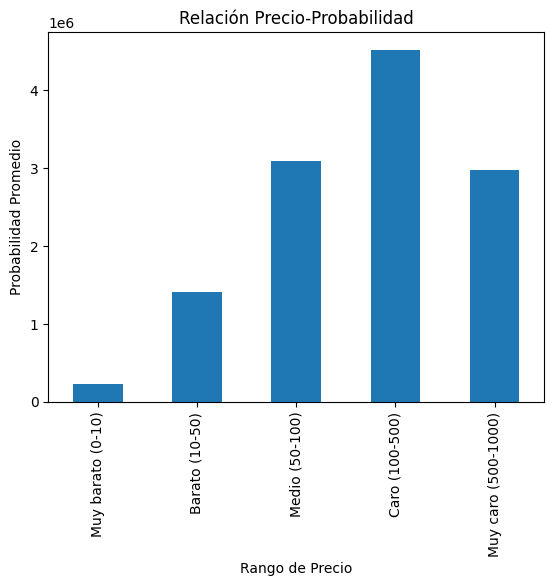

In [65]:
volumen_por_precio.plot(kind='bar', title='Relación Precio-Probabilidad', ylabel='Probabilidad Promedio', xlabel='Rango de Precio')

¿Cómo cambian precio, riesgo y probabilidad según la moneyness?

In [70]:
df_financiero_filtrado['rango_otm'] = pd.cut(
    df_financiero['otm %'],
    bins=[0, 0.05, 0.15, 0.30, 0.50, float('inf')],
    labels=[
    '0–5% (cerca/ATM)',
    '5–15% (OTM bajo)',
    '15–30% (OTM medio)',
    '30–50% (OTM alto)',
    '>50% (OTM extremo)'
],
    right=False
)

res_otm = df_financiero_filtrado.groupby('rango_otm')['precio'].mean()

print(res_otm)

rango_otm
0–5% (cerca/ATM)       9.502992
5–15% (OTM bajo)       7.598360
15–30% (OTM medio)     6.816656
30–50% (OTM alto)      6.046901
>50% (OTM extremo)    31.599962
Name: precio, dtype: float64


C:\Users\males\AppData\Local\Temp\ipykernel_9628\3685431667.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\males\AppData\Local\Temp\ipykernel_9628\3685431667.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: title={'center': 'Precio vs Rango OTM%'}, xlabel='rango_otm', ylabel='Precio promedio'>

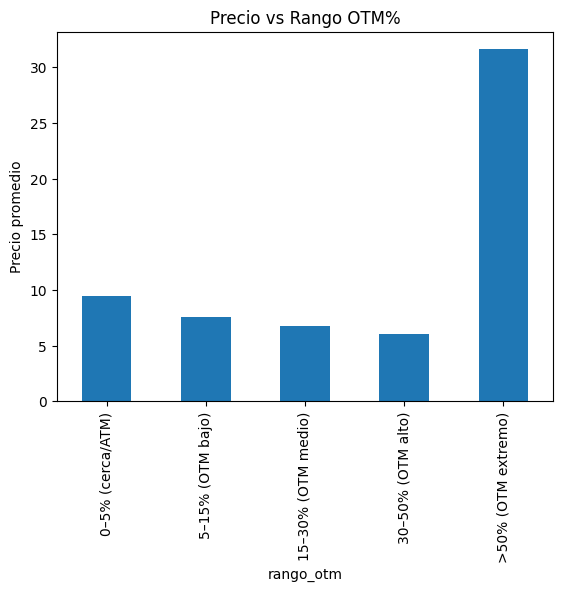

In [71]:
res_otm.plot(kind='bar', title='Precio vs Rango OTM%', ylabel='Precio promedio')


#### **CONCLUSIONES ANÁLISIS FINANCIERO**

##### ANÁLISIS 1
Diferencia entre precio real y valor teórico

El análisis de la diferencia entre el precio real de mercado y la prima teórica muestra que, para opciones de prima baja y media, el precio de mercado se mantiene relativamente cercano al valor teórico. Sin embargo, en opciones de prima alta y muy alta se observa una desviación considerable, indicando posibles ineficiencias de mercado, menor liquidez o la influencia de factores adicionales como volatilidad elevada o vencimientos largos. Esto sugiere que las opciones más caras tienden a estar más alejadas de su valoración teórica.



##### ANÁLISIS 2
Riesgo del mercado a través de la volatilidad implícita

La volatilidad implícita presenta una distribución asimétrica con presencia de valores extremos, aunque la mayoría de los contratos se concentra en niveles moderados de volatilidad. Esto sugiere que, si bien existen opciones de alto riesgo, el mercado en general opera mayoritariamente bajo escenarios de riesgo controlado. La existencia de outliers refleja momentos o contratos específicos con alta incertidumbre, pero no representan el comportamiento típico del mercado.



##### ANÁLISIS 3
Volatilidad implícita vs días restantes al vencimiento

El análisis muestra que la volatilidad implícita tiende a ser mayor cuando las opciones se encuentran próximas a su vencimiento y disminuye conforme aumenta el número de días restantes. Este comportamiento es consistente con la teoría financiera, ya que la incertidumbre sobre el precio final del activo subyacente se intensifica conforme se acerca la fecha de vencimiento. Esto confirma que el riesgo percibido es mayor en el corto plazo.



##### ANÁLISIS 4
Probabilidad de ejercicio

La distribución de la probabilidad de ejercicio indica que el mercado no se compone únicamente de apuestas altamente especulativas. Aunque existen opciones con baja probabilidad de ejercicio, una proporción significativa de contratos presenta probabilidades medias y altas. Esto sugiere una combinación de estrategias en el mercado, donde coexisten tanto posiciones especulativas como contratos utilizados para cobertura o estrategias más conservadoras.



##### ANÁLISIS 5
Relación entre OTM% y probabilidad de ejercicio

Se observa una relación negativa entre el porcentaje OTM y la probabilidad de ejercicio: a medida que la opción se encuentra más alejada del dinero, la probabilidad de que termine siendo ejercida disminuye de forma consistente. Esto confirma la coherencia financiera del dataset y refleja el comportamiento esperado del mercado, donde las opciones cercanas al dinero tienen mayores probabilidades de éxito que aquellas profundamente fuera del dinero.



##### ANÁLISIS 6
Relación precio–probabilidad de ejercicio

El análisis por rangos de precio muestra que las opciones más baratas presentan probabilidades de ejercicio significativamente menores, mientras que las opciones de precio medio concentran mayores probabilidades de éxito. Esto indica que el precio de una opción incorpora información relevante sobre su riesgo y su potencial de ejercicio, validando que el mercado tiende a asignar mayores precios a contratos con mayores probabilidades de terminar en ganancia.



##### ANÁLISIS 7
Moneyness (OTM%) y precio de las opciones

Tras filtrar valores atípicos, se observa una relación clara entre el moneyness y el precio de las opciones: conforme aumenta la distancia al dinero (OTM%), el precio mediano de las opciones disminuye progresivamente. Este patrón es consistente con la teoría financiera, ya que las opciones ATM son más costosas debido a su mayor probabilidad de ejercicio, mientras que las opciones OTM se vuelven más baratas al aumentar el riesgo de expirar sin valor.